In [1]:
from nuscenes.nuscenes import NuScenes


data_path = "/Users/ve/Documents/GitHub/robotvision@ML/v1.0-mini"
nusc = NuScenes(version='v1.0-mini', dataroot=data_path, verbose=True)


Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.288 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


In [2]:
nusc.list_scenes()

my_scene = nusc.scene[0]
first_sample_token = my_scene['first_sample_token']
sample = nusc.get('sample', first_sample_token)
print(sample)


scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

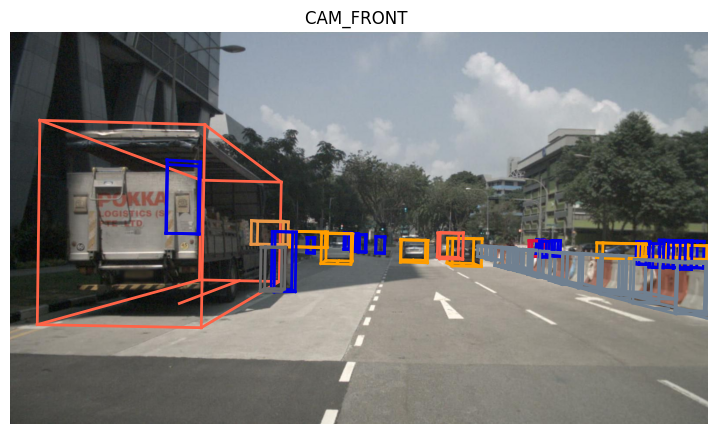

In [3]:
nusc.render_sample_data(sample['data']['CAM_FRONT'])


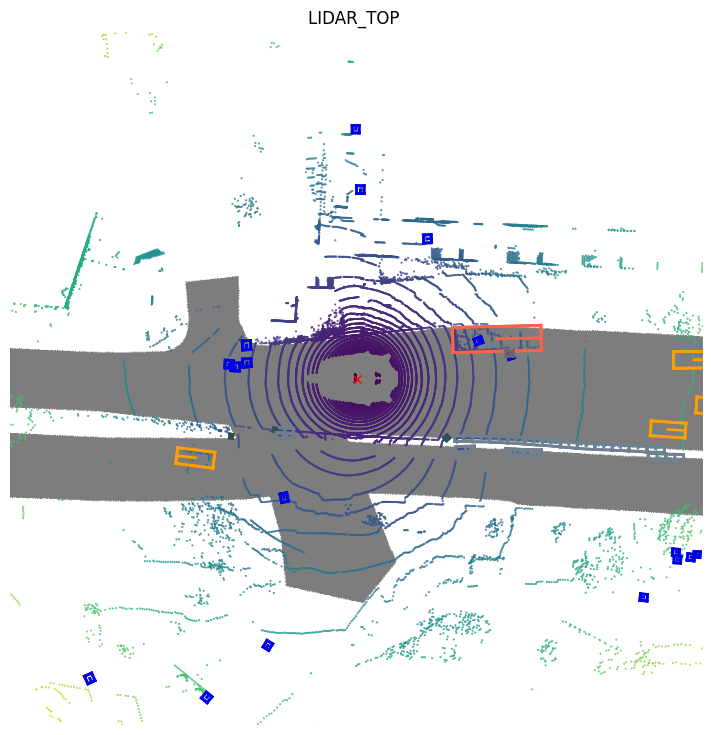

In [4]:
nusc.render_sample_data(sample['data']['LIDAR_TOP'])


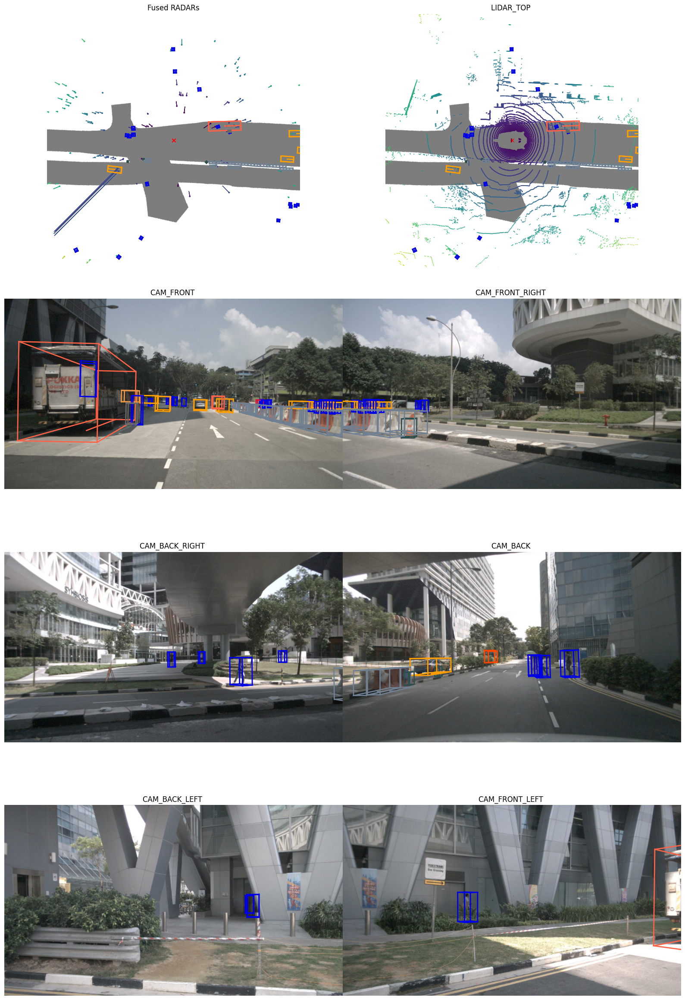

In [5]:
nusc.render_sample(sample['token'])


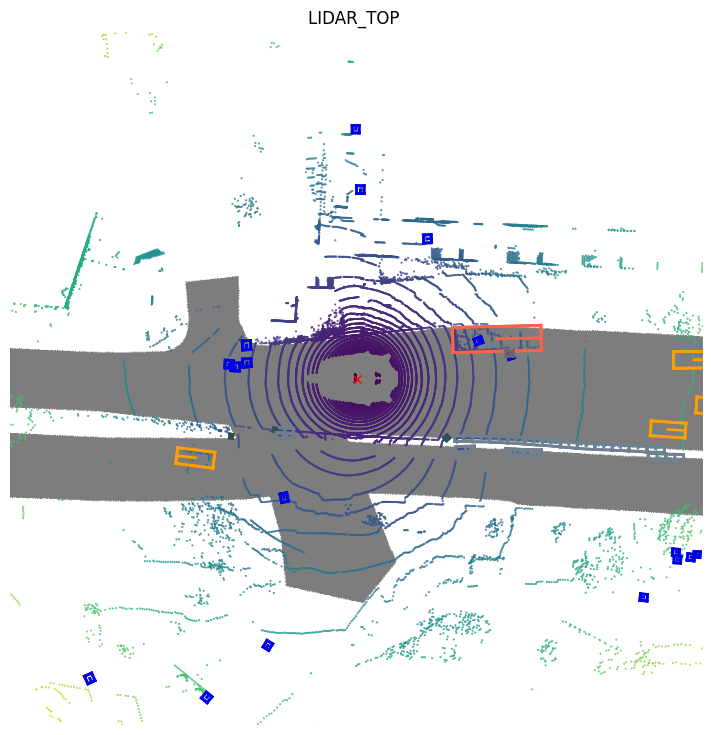

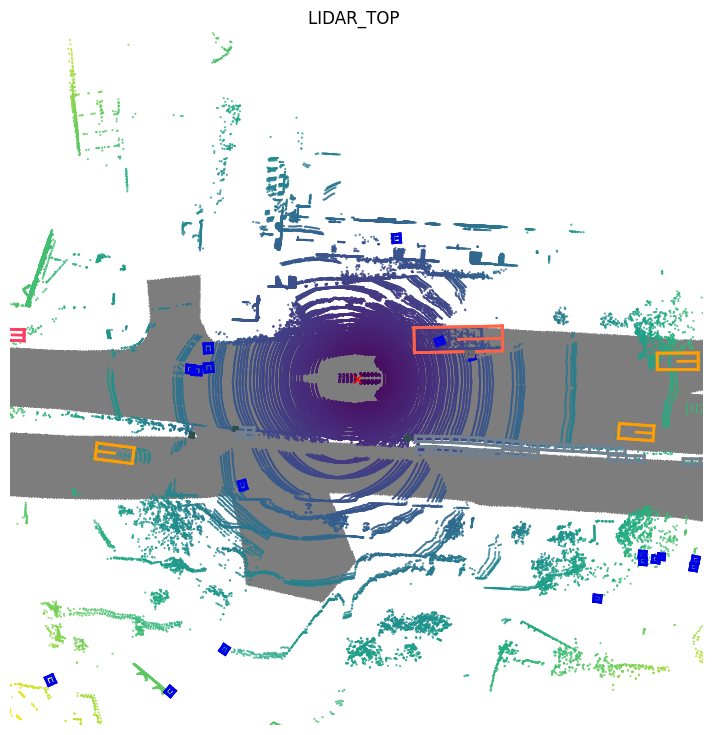

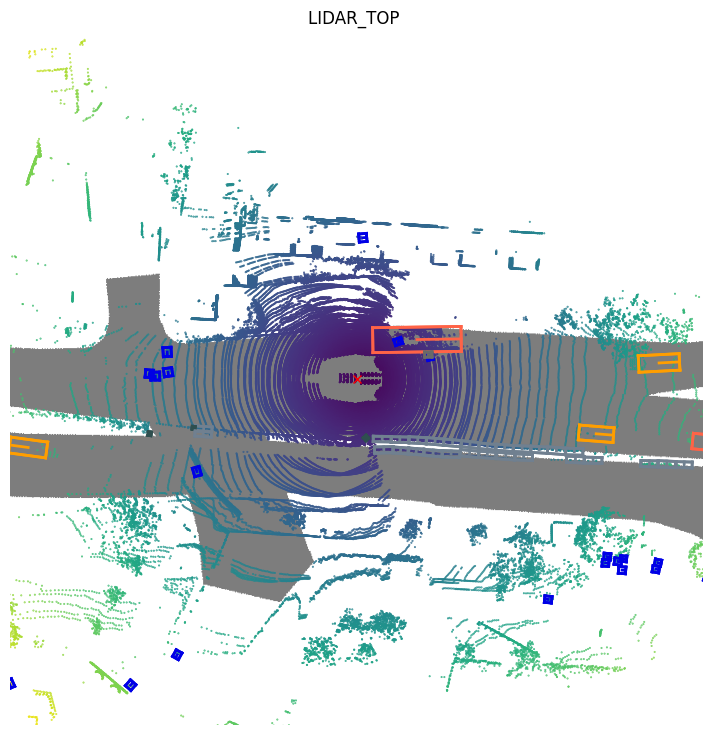

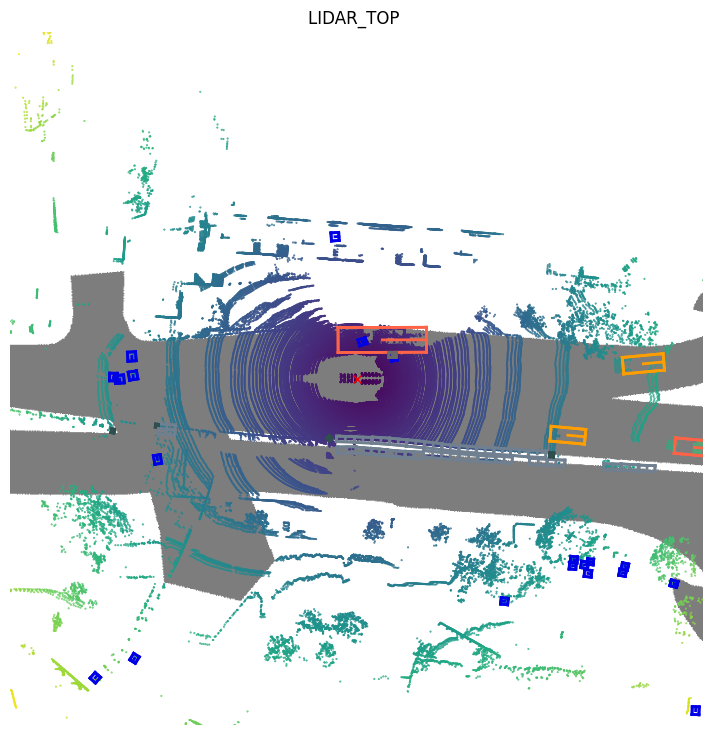

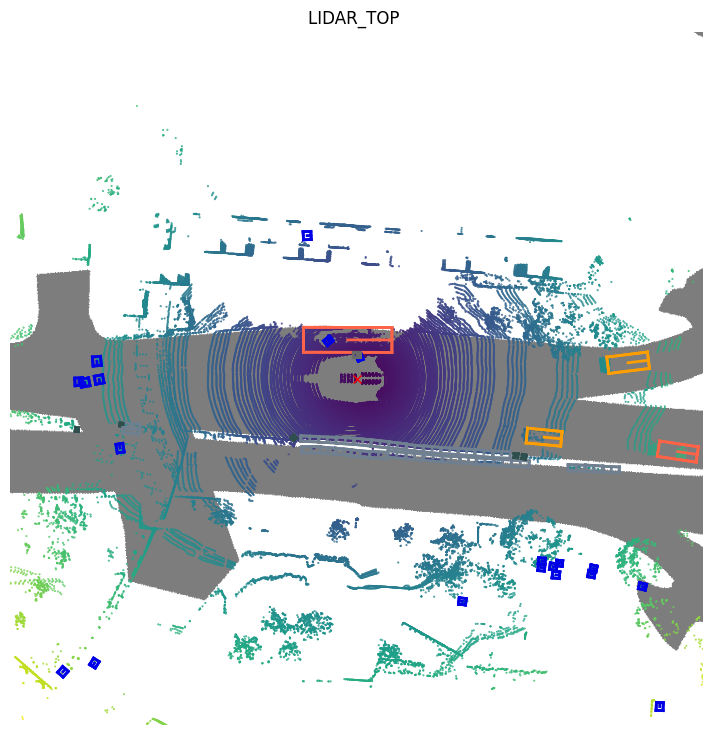

...

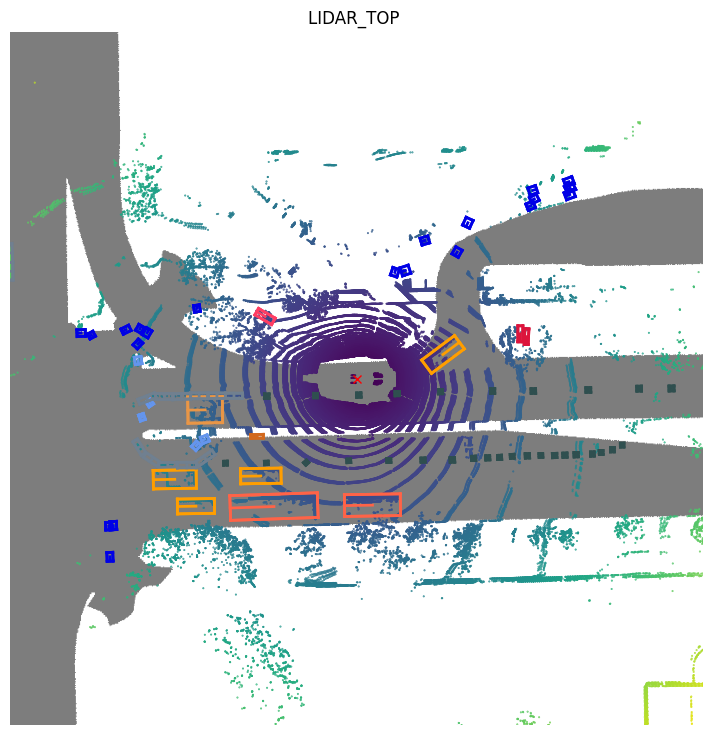

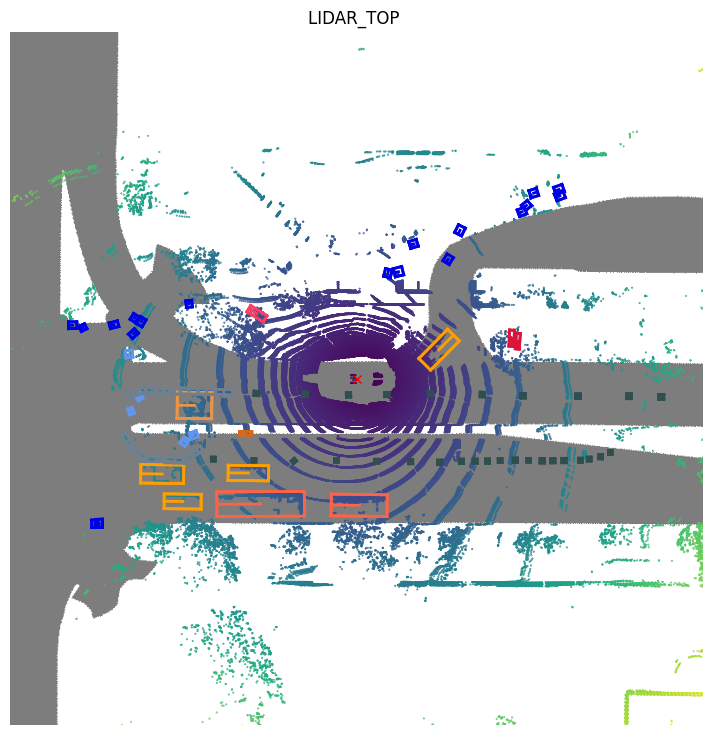

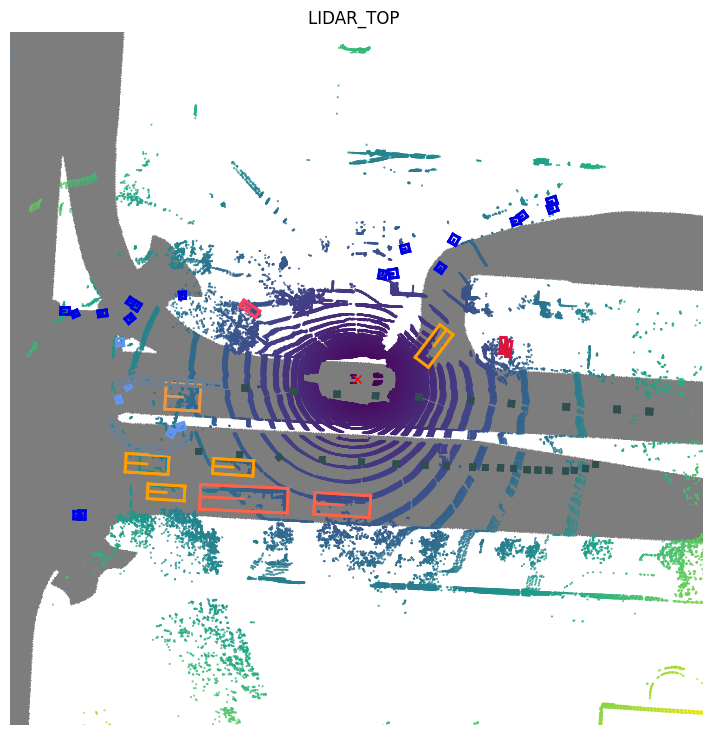

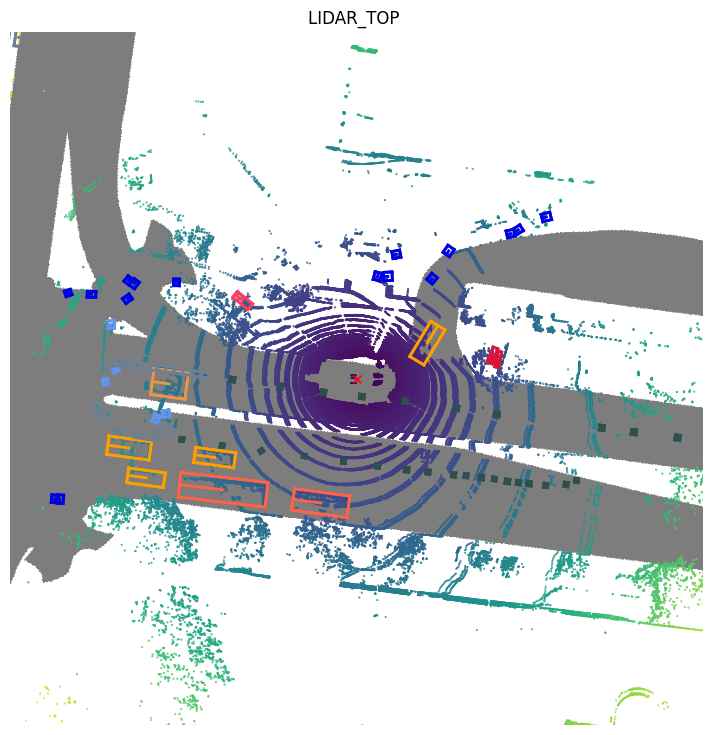

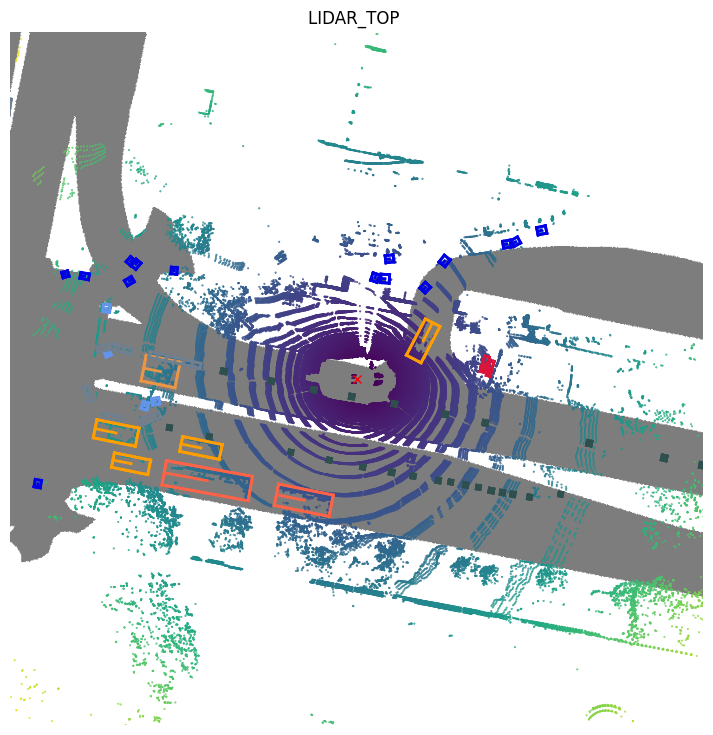

In [6]:
def render_scene_lidar(nusc, scene_idx=0, sensor='LIDAR_TOP'):
    scene = nusc.scene[scene_idx]
    sample_token = scene['first_sample_token']
    while sample_token != '':
        sample = nusc.get('sample', sample_token)
        nusc.render_sample_data(sample['data'][sensor], nsweeps=5)
        sample_token = sample['next']


render_scene_lidar(nusc, scene_idx=0, sensor='LIDAR_TOP')


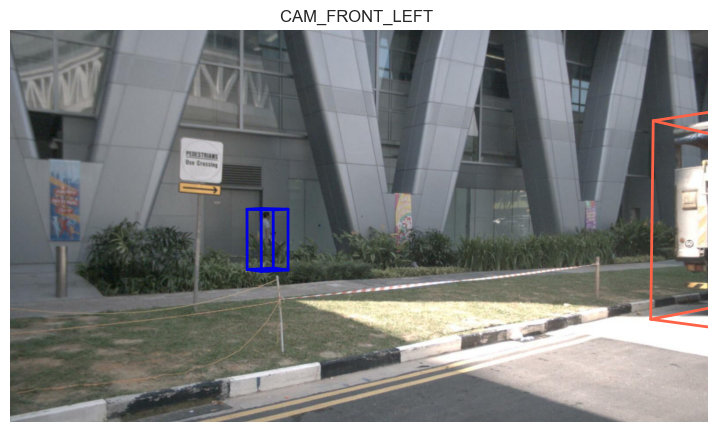

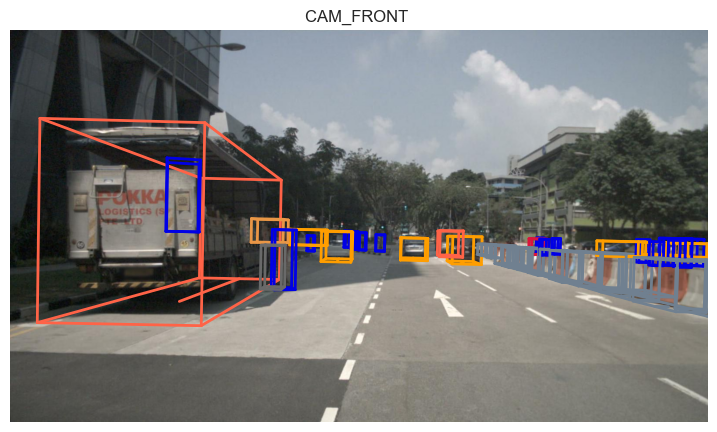

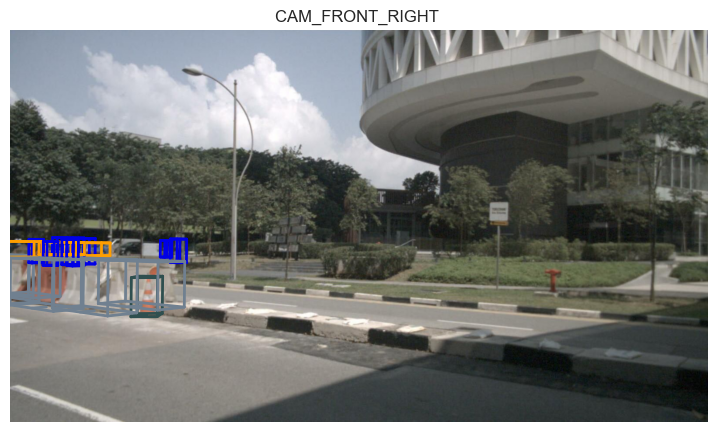

In [9]:
sample = nusc.get('sample', nusc.scene[0]['first_sample_token'])
cams = ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT']

for cam in cams:
    nusc.render_sample_data(sample['data'][cam], with_anns=True)
